# 🤪 WGAN - CelebA Faces

In this notebook, we'll walk through the steps required to train your own Wasserstein GAN on the CelebA faces dataset

The code has been adapted from the excellent [WGAN-GP tutorial](https://keras.io/examples/generative/wgan_gp/) created by Aakash Kumar Nain, available on the Keras website.

In [1]:
%load_ext autoreload
%autoreload 2
import numpy as np

import tensorflow as tf
from tensorflow.keras import (
    layers,
    models,
    callbacks,
    utils,
    metrics,
    optimizers,
)

from notebooks.utils import display, sample_batch

## 0. Parameters <a name="parameters"></a>

In [2]:
IMAGE_SIZE = 64
CHANNELS = 3
BATCH_SIZE = 512
NUM_FEATURES = 64
Z_DIM = 128
LEARNING_RATE = 0.0002
ADAM_BETA_1 = 0.5
ADAM_BETA_2 = 0.999
EPOCHS = 25
CRITIC_STEPS = 3
GP_WEIGHT = 10.0
LOAD_MODEL = False
ADAM_BETA_1 = 0.5
ADAM_BETA_2 = 0.9

## 1. Prepare the data <a name="prepare"></a>

In [3]:
# Load the data
train_data = utils.image_dataset_from_directory(
     "..\\..\\..\\data\\img_align_celeba",
    labels=None,
    color_mode="rgb",
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    batch_size=BATCH_SIZE,
    shuffle=True,
    seed=42,
    interpolation="bilinear",
)

Found 202599 files belonging to 1 classes.


In [4]:
# Preprocess the data
def preprocess(img):
    """
    Normalize and reshape the images
    """
    img = (tf.cast(img, "float32") - 127.5) / 127.5
    return img


train = train_data.map(lambda x: preprocess(x))

In [5]:
len(train)

396

In [6]:
# Show some faces from the training set
train_sample = sample_batch(train)

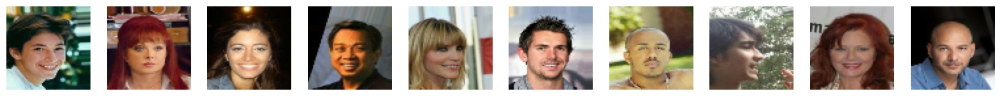

In [7]:
display(train_sample, cmap=None)

## 2. Build the WGAN-GP <a name="build"></a>

In [8]:
critic_input = layers.Input(shape=(IMAGE_SIZE, IMAGE_SIZE, CHANNELS))
x = layers.Conv2D(64, kernel_size=4, strides=2, padding="same")(critic_input)
x = layers.LeakyReLU(0.2)(x)
x = layers.Conv2D(128, kernel_size=4, strides=2, padding="same")(x)
x = layers.LeakyReLU()(x)
x = layers.Dropout(0.3)(x)
x = layers.Conv2D(256, kernel_size=4, strides=2, padding="same")(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Dropout(0.3)(x)
x = layers.Conv2D(512, kernel_size=4, strides=2, padding="same")(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Dropout(0.3)(x)
x = layers.Conv2D(1, kernel_size=4, strides=1, padding="valid")(x)
critic_output = layers.Flatten()(x)

critic = models.Model(critic_input, critic_output)
critic.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 64, 64, 3)]       0         
                                                                 
 conv2d (Conv2D)             (None, 32, 32, 64)        3136      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 32, 32, 64)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 128)       131200    
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 16, 16, 128)       0         
                                                                 
 dropout (Dropout)           (None, 16, 16, 128)       0         
                                                                 
 conv2d_2 (Conv2D)           (None, 8, 8, 256)         524544

In [9]:
generator_input = layers.Input(shape=(Z_DIM,))
x = layers.Reshape((1, 1, Z_DIM))(generator_input)
x = layers.Conv2DTranspose(
    512, kernel_size=4, strides=1, padding="valid", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Conv2DTranspose(
    256, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Conv2DTranspose(
    128, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Conv2DTranspose(
    64, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
generator_output = layers.Conv2DTranspose(
    CHANNELS, kernel_size=4, strides=2, padding="same", activation="tanh"
)(x)
generator = models.Model(generator_input, generator_output)
generator.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 128)]             0         
                                                                 
 reshape (Reshape)           (None, 1, 1, 128)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 4, 4, 512)        1048576   
 nspose)                                                         
                                                                 
 batch_normalization (BatchN  (None, 4, 4, 512)        2048      
 ormalization)                                                   
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 4, 4, 512)         0         
                                                                 
 conv2d_transpose_1 (Conv2DT  (None, 8, 8, 256)        2097

In [10]:
class WGANGP(models.Model):
    def __init__(self, critic, generator, latent_dim, critic_steps, gp_weight):
        super(WGANGP, self).__init__()
        self.critic = critic
        self.generator = generator
        self.latent_dim = latent_dim
        self.critic_steps = critic_steps
        self.gp_weight = gp_weight

    def compile(self, c_optimizer, g_optimizer):
        super(WGANGP, self).compile()
        self.c_optimizer = c_optimizer
        self.g_optimizer = g_optimizer
        self.c_wass_loss_metric = metrics.Mean(name="c_wass_loss")
        self.c_gp_metric = metrics.Mean(name="c_gp")
        self.c_loss_metric = metrics.Mean(name="c_loss")
        self.g_loss_metric = metrics.Mean(name="g_loss")

    @property
    def metrics(self):
        return [
            self.c_loss_metric,
            self.c_wass_loss_metric,
            self.c_gp_metric,
            self.g_loss_metric,
        ]

    def gradient_penalty(self, batch_size, real_images, fake_images):
        alpha = tf.random.normal([batch_size, 1, 1, 1], 0.0, 1.0)
        diff = fake_images - real_images
        interpolated = real_images + alpha * diff

        with tf.GradientTape() as gp_tape:
            gp_tape.watch(interpolated)
            pred = self.critic(interpolated, training=True)

        grads = gp_tape.gradient(pred, [interpolated])[0]
        norm = tf.sqrt(tf.reduce_sum(tf.square(grads), axis=[1, 2, 3]))
        gp = tf.reduce_mean((norm - 1.0) ** 2)
        return gp

    def train_step(self, real_images):
        batch_size = tf.shape(real_images)[0]

        for i in range(self.critic_steps):
            random_latent_vectors = tf.random.normal(
                shape=(batch_size, self.latent_dim)
            )

            with tf.GradientTape() as tape:
                fake_images = self.generator(
                    random_latent_vectors, training=True
                )
                fake_predictions = self.critic(fake_images, training=True)
                real_predictions = self.critic(real_images, training=True)

                c_wass_loss = tf.reduce_mean(fake_predictions) - tf.reduce_mean(
                    real_predictions
                )
                c_gp = self.gradient_penalty(
                    batch_size, real_images, fake_images
                )
                c_loss = c_wass_loss + c_gp * self.gp_weight

            c_gradient = tape.gradient(c_loss, self.critic.trainable_variables)
            self.c_optimizer.apply_gradients(
                zip(c_gradient, self.critic.trainable_variables)
            )

        random_latent_vectors = tf.random.normal(
            shape=(batch_size, self.latent_dim)
        )
        with tf.GradientTape() as tape:
            fake_images = self.generator(random_latent_vectors, training=True)
            fake_predictions = self.critic(fake_images, training=True)
            g_loss = -tf.reduce_mean(fake_predictions)

        gen_gradient = tape.gradient(g_loss, self.generator.trainable_variables)
        self.g_optimizer.apply_gradients(
            zip(gen_gradient, self.generator.trainable_variables)
        )

        self.c_loss_metric.update_state(c_loss)
        self.c_wass_loss_metric.update_state(c_wass_loss)
        self.c_gp_metric.update_state(c_gp)
        self.g_loss_metric.update_state(g_loss)

        return {m.name: m.result() for m in self.metrics}

In [11]:
# Create a GAN
wgangp = WGANGP(
    critic=critic,
    generator=generator,
    latent_dim=Z_DIM,
    critic_steps=CRITIC_STEPS,
    gp_weight=GP_WEIGHT,
)

In [12]:
if LOAD_MODEL:
    wgangp.load_weights("./checkpoint/checkpoint.ckpt")

## 3. Train the GAN <a name="train"></a>

In [13]:
# Compile the GAN
wgangp.compile(
    c_optimizer=optimizers.Adam(
        learning_rate=LEARNING_RATE, beta_1=ADAM_BETA_1, beta_2=ADAM_BETA_2
    ),
    g_optimizer=optimizers.Adam(
        learning_rate=LEARNING_RATE, beta_1=ADAM_BETA_1, beta_2=ADAM_BETA_2
    ),
)

In [14]:
# Create a model save checkpoint
model_checkpoint_callback = callbacks.ModelCheckpoint(
    filepath="./checkpoint/checkpoint.ckpt",
    save_weights_only=True,
    save_freq="epoch",
    verbose=0,
)

tensorboard_callback = callbacks.TensorBoard(log_dir="./logs")


class ImageGenerator(callbacks.Callback):
    def __init__(self, num_img, latent_dim):
        self.num_img = num_img
        self.latent_dim = latent_dim

    def on_epoch_end(self, epoch, logs=None):
        random_latent_vectors = tf.random.normal(
            shape=(self.num_img, self.latent_dim)
        )
        generated_images = self.model.generator(random_latent_vectors)
        generated_images = generated_images * 127.5 + 127.5
        generated_images = generated_images.numpy()
        display(
            generated_images,
            save_to="./output/generated_img_%03d.png" % (epoch),
            cmap=None,
        )

Epoch 1/25
396/396 [==============================] - ETA: 0s - c_loss: -22.1781 - c_wass_loss: -29.2917 - c_gp: 0.7114 - g_loss: -23.1596
Saved to ./output/generated_img_000.png


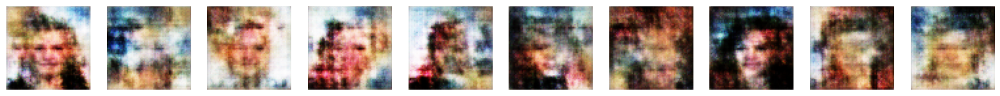

396/396 [==============================] - 107s 249ms/step - c_loss: -22.1781 - c_wass_loss: -29.2917 - c_gp: 0.7114 - g_loss: -23.1596
Epoch 2/25
396/396 [==============================] - ETA: 0s - c_loss: -8.7598 - c_wass_loss: -10.0502 - c_gp: 0.1290 - g_loss: -29.9231
Saved to ./output/generated_img_001.png


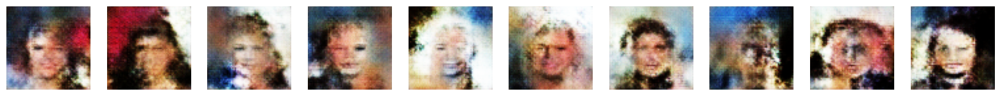

396/396 [==============================] - 101s 253ms/step - c_loss: -8.7598 - c_wass_loss: -10.0502 - c_gp: 0.1290 - g_loss: -29.9231
Epoch 3/25
396/396 [==============================] - ETA: 0s - c_loss: -6.8293 - c_wass_loss: -7.7076 - c_gp: 0.0878 - g_loss: -16.5921
Saved to ./output/generated_img_002.png


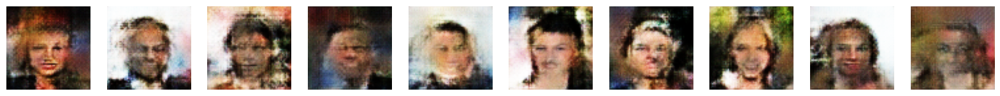

396/396 [==============================] - 99s 248ms/step - c_loss: -6.8293 - c_wass_loss: -7.7076 - c_gp: 0.0878 - g_loss: -16.5921
Epoch 4/25
396/396 [==============================] - ETA: 0s - c_loss: -5.9742 - c_wass_loss: -6.6922 - c_gp: 0.0718 - g_loss: -6.4849
Saved to ./output/generated_img_003.png


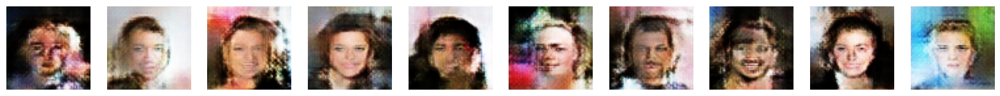

396/396 [==============================] - 96s 240ms/step - c_loss: -5.9742 - c_wass_loss: -6.6922 - c_gp: 0.0718 - g_loss: -6.4849
Epoch 5/25
396/396 [==============================] - ETA: 0s - c_loss: -5.3911 - c_wass_loss: -5.9962 - c_gp: 0.0605 - g_loss: -1.5946
Saved to ./output/generated_img_004.png


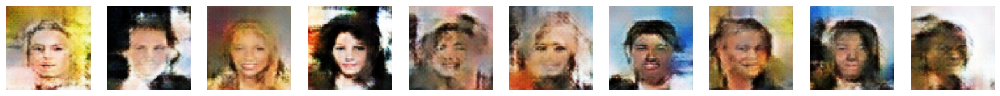

396/396 [==============================] - 101s 253ms/step - c_loss: -5.3911 - c_wass_loss: -5.9962 - c_gp: 0.0605 - g_loss: -1.5946
Epoch 6/25
396/396 [==============================] - ETA: 0s - c_loss: -4.9430 - c_wass_loss: -5.4644 - c_gp: 0.0521 - g_loss: -0.2873
Saved to ./output/generated_img_005.png


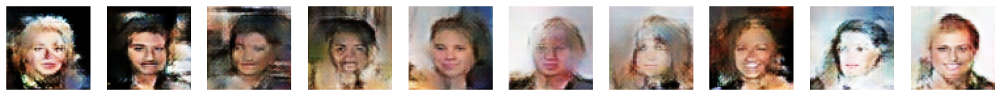

396/396 [==============================] - 92s 230ms/step - c_loss: -4.9430 - c_wass_loss: -5.4644 - c_gp: 0.0521 - g_loss: -0.2873
Epoch 7/25
396/396 [==============================] - ETA: 0s - c_loss: -4.6237 - c_wass_loss: -5.0812 - c_gp: 0.0457 - g_loss: -0.6951
Saved to ./output/generated_img_006.png


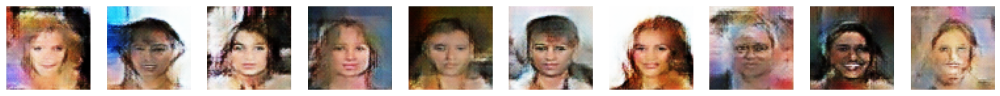

396/396 [==============================] - 94s 234ms/step - c_loss: -4.6237 - c_wass_loss: -5.0812 - c_gp: 0.0457 - g_loss: -0.6951
Epoch 8/25
396/396 [==============================] - ETA: 0s - c_loss: -4.3526 - c_wass_loss: -4.7778 - c_gp: 0.0425 - g_loss: 1.4743
Saved to ./output/generated_img_007.png


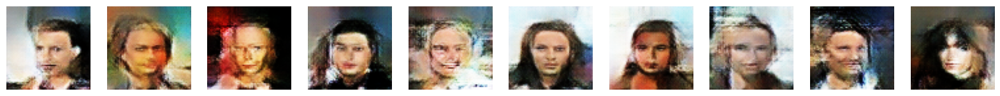

396/396 [==============================] - 92s 231ms/step - c_loss: -4.3526 - c_wass_loss: -4.7778 - c_gp: 0.0425 - g_loss: 1.4743
Epoch 9/25
396/396 [==============================] - ETA: 0s - c_loss: -4.1948 - c_wass_loss: -4.5915 - c_gp: 0.0397 - g_loss: 2.4280
Saved to ./output/generated_img_008.png


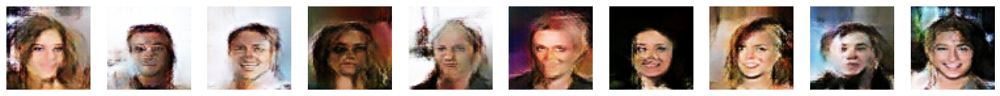

396/396 [==============================] - 92s 230ms/step - c_loss: -4.1948 - c_wass_loss: -4.5915 - c_gp: 0.0397 - g_loss: 2.4280
Epoch 10/25
396/396 [==============================] - ETA: 0s - c_loss: -3.9594 - c_wass_loss: -4.3292 - c_gp: 0.0370 - g_loss: 3.1117
Saved to ./output/generated_img_009.png


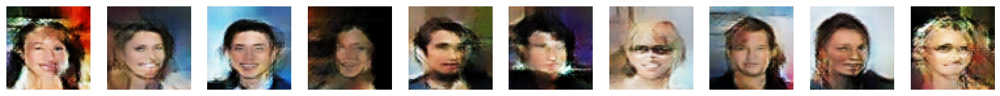

396/396 [==============================] - 92s 231ms/step - c_loss: -3.9594 - c_wass_loss: -4.3292 - c_gp: 0.0370 - g_loss: 3.1117
Epoch 11/25
396/396 [==============================] - ETA: 0s - c_loss: -3.7826 - c_wass_loss: -4.1240 - c_gp: 0.0341 - g_loss: 3.8208
Saved to ./output/generated_img_010.png


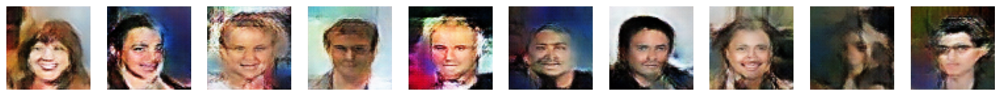

396/396 [==============================] - 92s 231ms/step - c_loss: -3.7826 - c_wass_loss: -4.1240 - c_gp: 0.0341 - g_loss: 3.8208
Epoch 12/25
396/396 [==============================] - ETA: 0s - c_loss: -3.6103 - c_wass_loss: -3.9249 - c_gp: 0.0315 - g_loss: 4.5929
Saved to ./output/generated_img_011.png


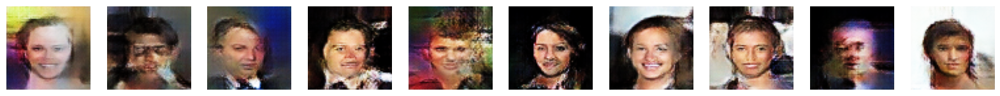

396/396 [==============================] - 93s 232ms/step - c_loss: -3.6103 - c_wass_loss: -3.9249 - c_gp: 0.0315 - g_loss: 4.5929
Epoch 13/25
396/396 [==============================] - ETA: 0s - c_loss: -3.4895 - c_wass_loss: -3.7846 - c_gp: 0.0295 - g_loss: 4.3837
Saved to ./output/generated_img_012.png


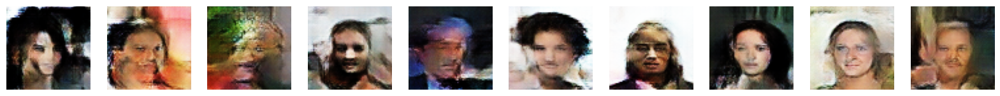

396/396 [==============================] - 92s 231ms/step - c_loss: -3.4895 - c_wass_loss: -3.7846 - c_gp: 0.0295 - g_loss: 4.3837
Epoch 14/25
396/396 [==============================] - ETA: 0s - c_loss: -3.3872 - c_wass_loss: -3.6768 - c_gp: 0.0290 - g_loss: 5.2764
Saved to ./output/generated_img_013.png


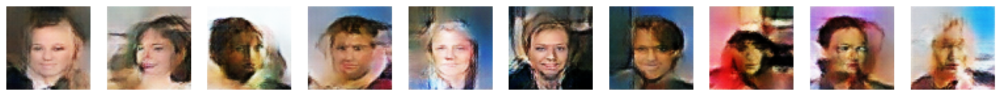

396/396 [==============================] - 95s 237ms/step - c_loss: -3.3872 - c_wass_loss: -3.6768 - c_gp: 0.0290 - g_loss: 5.2764
Epoch 15/25
396/396 [==============================] - ETA: 0s - c_loss: -3.2082 - c_wass_loss: -3.4668 - c_gp: 0.0259 - g_loss: 5.4909
Saved to ./output/generated_img_014.png


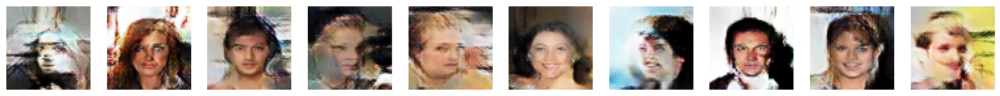

396/396 [==============================] - 92s 231ms/step - c_loss: -3.2082 - c_wass_loss: -3.4668 - c_gp: 0.0259 - g_loss: 5.4909
Epoch 16/25
396/396 [==============================] - ETA: 0s - c_loss: -3.1159 - c_wass_loss: -3.3669 - c_gp: 0.0251 - g_loss: 5.3851
Saved to ./output/generated_img_015.png


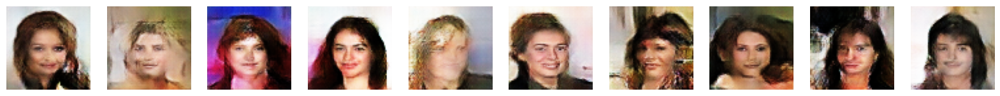

396/396 [==============================] - 92s 231ms/step - c_loss: -3.1159 - c_wass_loss: -3.3669 - c_gp: 0.0251 - g_loss: 5.3851
Epoch 17/25
396/396 [==============================] - ETA: 0s - c_loss: -3.0487 - c_wass_loss: -3.2880 - c_gp: 0.0239 - g_loss: 6.3862
Saved to ./output/generated_img_016.png


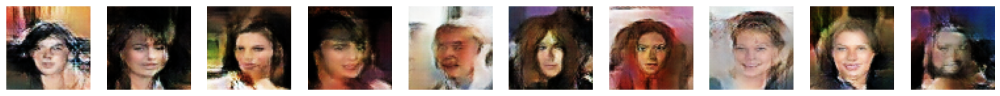

396/396 [==============================] - 93s 233ms/step - c_loss: -3.0487 - c_wass_loss: -3.2880 - c_gp: 0.0239 - g_loss: 6.3862
Epoch 18/25
396/396 [==============================] - ETA: 0s - c_loss: -2.9568 - c_wass_loss: -3.1853 - c_gp: 0.0229 - g_loss: 6.9096
Saved to ./output/generated_img_017.png


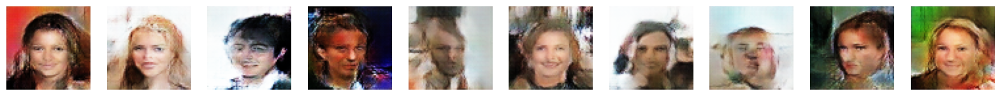

396/396 [==============================] - 92s 230ms/step - c_loss: -2.9568 - c_wass_loss: -3.1853 - c_gp: 0.0229 - g_loss: 6.9096
Epoch 19/25
396/396 [==============================] - ETA: 0s - c_loss: -2.8161 - c_wass_loss: -3.0367 - c_gp: 0.0221 - g_loss: 5.5335
Saved to ./output/generated_img_018.png


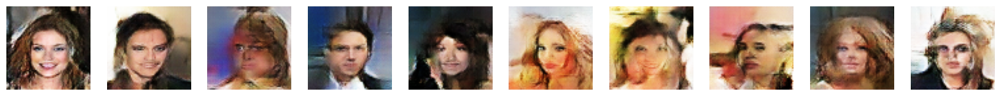

396/396 [==============================] - 92s 229ms/step - c_loss: -2.8161 - c_wass_loss: -3.0367 - c_gp: 0.0221 - g_loss: 5.5335
Epoch 20/25
396/396 [==============================] - ETA: 0s - c_loss: -2.7875 - c_wass_loss: -3.0037 - c_gp: 0.0216 - g_loss: 6.5778
Saved to ./output/generated_img_019.png


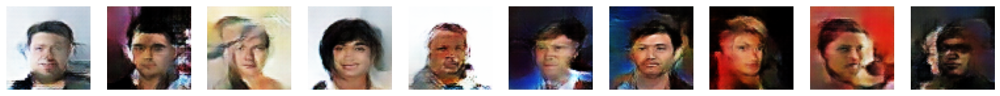

396/396 [==============================] - 98s 245ms/step - c_loss: -2.7875 - c_wass_loss: -3.0037 - c_gp: 0.0216 - g_loss: 6.5778
Epoch 21/25
396/396 [==============================] - ETA: 0s - c_loss: -2.7330 - c_wass_loss: -2.9395 - c_gp: 0.0206 - g_loss: 5.0608
Saved to ./output/generated_img_020.png


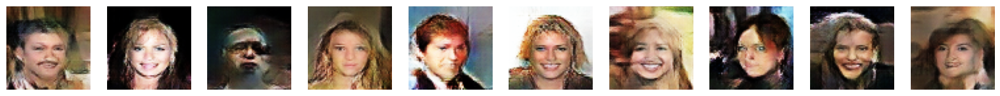

396/396 [==============================] - 92s 230ms/step - c_loss: -2.7330 - c_wass_loss: -2.9395 - c_gp: 0.0206 - g_loss: 5.0608
Epoch 22/25
396/396 [==============================] - ETA: 0s - c_loss: -2.6401 - c_wass_loss: -2.8403 - c_gp: 0.0200 - g_loss: 5.2561
Saved to ./output/generated_img_021.png


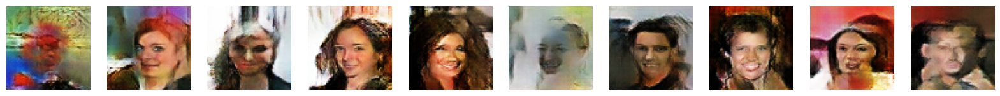

396/396 [==============================] - 92s 230ms/step - c_loss: -2.6401 - c_wass_loss: -2.8403 - c_gp: 0.0200 - g_loss: 5.2561
Epoch 23/25
396/396 [==============================] - ETA: 0s - c_loss: -2.5706 - c_wass_loss: -2.7649 - c_gp: 0.0194 - g_loss: 6.1058
Saved to ./output/generated_img_022.png


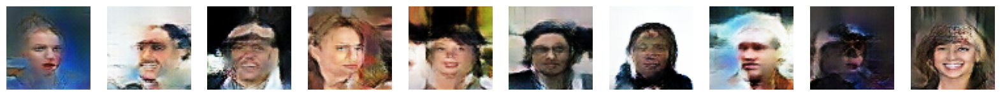

396/396 [==============================] - 93s 233ms/step - c_loss: -2.5706 - c_wass_loss: -2.7649 - c_gp: 0.0194 - g_loss: 6.1058
Epoch 24/25
396/396 [==============================] - ETA: 0s - c_loss: -2.5203 - c_wass_loss: -2.7085 - c_gp: 0.0188 - g_loss: 6.9880
Saved to ./output/generated_img_023.png


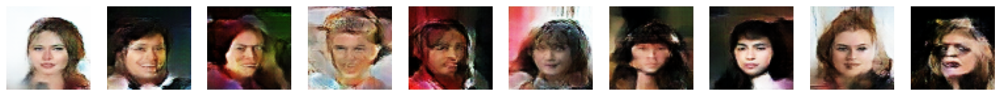

396/396 [==============================] - 92s 230ms/step - c_loss: -2.5203 - c_wass_loss: -2.7085 - c_gp: 0.0188 - g_loss: 6.9880
Epoch 25/25
396/396 [==============================] - ETA: 0s - c_loss: -2.4519 - c_wass_loss: -2.6292 - c_gp: 0.0177 - g_loss: 5.9811
Saved to ./output/generated_img_024.png


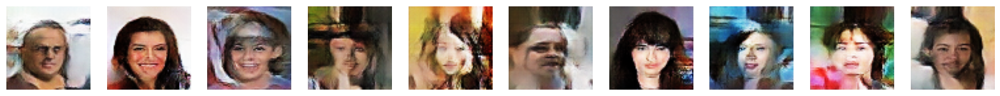

396/396 [==============================] - 92s 231ms/step - c_loss: -2.4519 - c_wass_loss: -2.6292 - c_gp: 0.0177 - g_loss: 5.9811


In [15]:
wgangp.fit(
    train,
    epochs=EPOCHS,
    callbacks=[
        model_checkpoint_callback,
        tensorboard_callback,
        ImageGenerator(num_img=10, latent_dim=Z_DIM),
    ],
)

In [16]:
# Save the final models
generator.save("./models/generator")
critic.save("./models/critic")

INFO:tensorflow:Assets written to: ./models/generator\assets


INFO:tensorflow:Assets written to: ./models/generator\assets


INFO:tensorflow:Assets written to: ./models/critic\assets


INFO:tensorflow:Assets written to: ./models/critic\assets


## Generate images

1/1 [==============================] - 0s 94ms/step


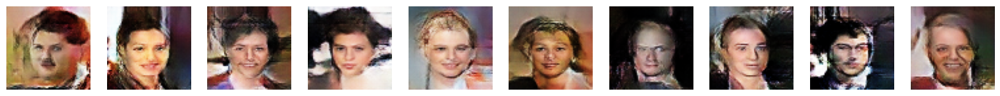

In [17]:
z_sample = np.random.normal(size=(10, Z_DIM))
imgs = wgangp.generator.predict(z_sample)
display(imgs, cmap=None)